<a href="https://colab.research.google.com/github/PaulBunkie/veo/blob/main/Clip.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%pip install -U -q "google-genai>=1.44.0" # Minimum version 1.44 for video extension

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.2/53.2 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 728.8/728.8 kB 13.4 MB/s eta 0:00:00


In [ ]:
# Ставим правильную библиотеку (Vertex AI)
!pip install --upgrade google-cloud-aiplatform -q

# Вызываем системное окно авторизации Colab
from google.colab import auth
auth.authenticate_user()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.9/46.9 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.2/8.2 MB 52.3 MB/s eta 0:00:00


In [ ]:
# 2. Импортируем библиотеку, которую требует этот туториал
from google import genai

# 3. Создаем тот самый client, пуская его в обход блокировок ключей (через Vertex AI)
PROJECT_ID = "project-97440ad7-9594-40c4-826"

client = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location="us-central1" # Модели Veo обычно лежат в этом регионе
)

print("Client успешно создан! Можно запускать генерацию.")

Client успешно создан! Можно запускать генерацию.


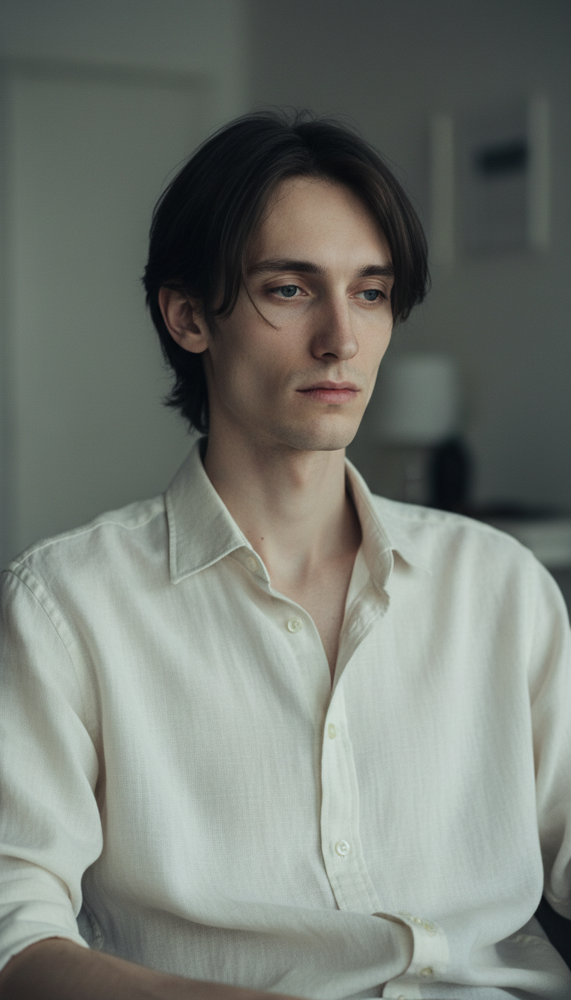

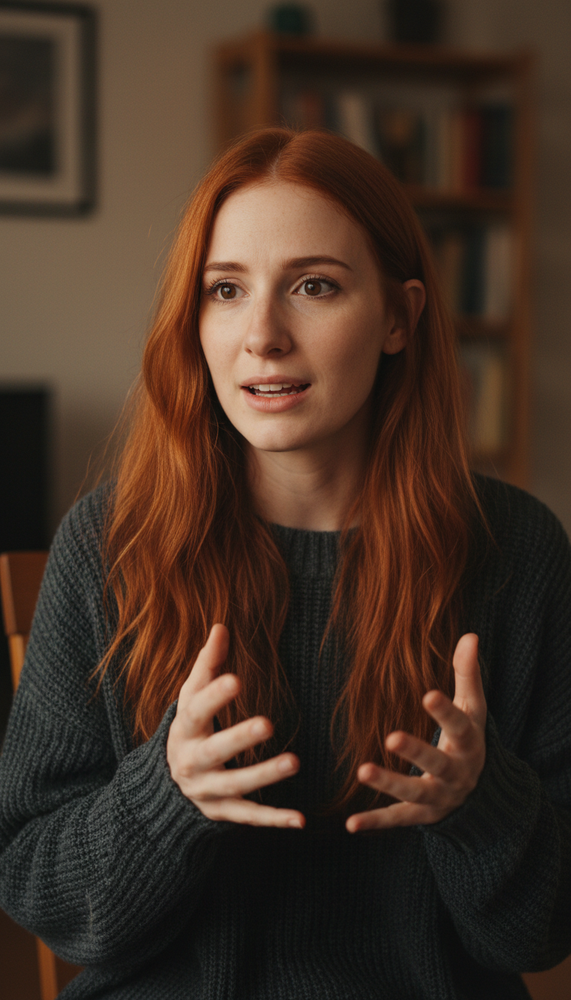

In [ ]:
aspect_ratio="9:16"
from google.genai import types

# 2. Импортируем библиотеку, которую требует этот туториал
from google import genai

# 3. Создаем тот самый client, пуская его в обход блокировок ключей (через Vertex AI)
PROJECT_ID = "project-97440ad7-9594-40c4-826"

client = genai.Client(
    vertexai=True,
    project=PROJECT_ID,
    location="global"#"us-central1" ## Модели Veo обычно лежат в этом регионе
)

response = client.models.generate_content(
    model="gemini-2.5-flash-image",
    contents=["A pale, slender young man in his mid-20s with delicate facial features and a slightly melancholic expression. Thin face, subtle cheekbones, light skin with a cold undertone. Dark, slightly messy medium-length hair falling over his forehead. Grey or muted blue tired eyes. He has an elegant, almost fragile build. Wearing a simple light-colored slightly wrinkled button-up shirt with the top buttons undone. His posture is calm but introspective, hands relaxed, body language reserved. Natural lighting, realistic skin texture, cinematic photography, soft shadows, indie film aesthetic, no fantasy elements, modern everyday realism."],
    config=types.GenerateContentConfig(
        response_modalities=["IMAGE"],
        image_config=types.ImageConfig(
            aspect_ratio=aspect_ratio,
        )
    )
)
for part in response.parts:
    if part.inline_data:
        moon_image = part.as_image()
        break
moon_image.show()
moon_image.save('moon_boy.jpg')

response = client.models.generate_content(
    model="gemini-2.5-flash-image",
    contents=["A young woman in her mid-20s with striking bright copper-red hair, long and slightly wavy, vibrant and luminous against her fair skin. Expressive green or warm brown eyes, lively but emotional gaze. Light freckles across her nose and cheeks. Natural makeup, slightly flushed skin. Slim build, expressive hands, animated body language as if she is in the middle of telling a passionate story. Wearing a dark oversized sweater. She radiates warmth and intensity without being glamorous. Realistic photography, cinematic lighting, natural skin texture, emotional presence, indie movie style, warm color tones, intimate atmosphere."],
    config=types.GenerateContentConfig(
        response_modalities=["IMAGE"],
        image_config=types.ImageConfig(
            aspect_ratio=aspect_ratio,
        )
    )
)
for part in response.parts:
    if part.inline_data:
        sun_image = part.as_image()
        break
sun_image.show()
sun_image.save('sun.girl.jpg')

In [ ]:
import time
import PIL.Image
import io
from google.genai import types
from google.colab import files
from IPython.display import display, Video

def create_genai_image_from_file(filepath):
    pil_image = PIL.Image.open(filepath)
    image_bytes_io = io.BytesIO()
    pil_image.save(image_bytes_io, format=pil_image.format)
    image_bytes = image_bytes_io.getvalue()
    # Determine mime_type from PIL image format
    mime_type_map = {
        "JPEG": "image/jpeg",
        "PNG": "image/png",
        "GIF": "image/gif",
        "BMP": "image/bmp",
        "TIFF": "image/tiff",
    }
    mime_type = mime_type_map.get(pil_image.format.upper(), "image/jpeg") # Default to jpeg
    return types.Image(image_bytes=image_bytes, mime_type=mime_type)

prompt = "realistic cinematic live action scene, modern suburban house exterior, neutral beige facade, white front door, soft daylight, steady camera, medium shot from behind the woman (Sun, as reference). She walks to the door and presses the doorbell. After a moment the door opens. A young man (Moon, as reference) stands in the doorway and looks at her calmly. He steps slightly aside. Natural everyday interaction, relaxed atmosphere, consistent environment, no dramatic elements, no conflict, no violence." # @param {"type":"string","placeholder":"Write your own prompt or leave empty to let the model decide"}

# Optional parameters
negative_prompt = "ugly, low quality, static, weird physics" # @param {type: "string"}
aspect_ratio = "16:9" # @param ["16:9"] # Only landscape is supported
resolution = "720p" # @param ["720p"] # Only 720p is supported

# 1. Создаем объекты Image из файлов
#scene_image_obj = create_genai_image_from_file('start_frame7.jpg')
moon_image_obj = create_genai_image_from_file('moon_boy.jpg')
sun_image_obj = create_genai_image_from_file('sun.girl.jpg') # Corrected filename

# 2. Оборачиваем их для Veo
# scene_reference = types.VideoGenerationReferenceImage(
#     image=scene_image_obj,
#     reference_type="asset"
# )
moon_reference = types.VideoGenerationReferenceImage(
    image=moon_image_obj,
    reference_type="asset"
)
sun_reference = types.VideoGenerationReferenceImage(
    image=sun_image_obj,
    reference_type="asset"
)

operation = client.models.generate_videos(
    model="veo-3.1-generate-preview", # Reference to video only wirk with Veo 3.1 at the moment
    prompt=prompt,
    config=types.GenerateVideosConfig(
      aspect_ratio=aspect_ratio,
      resolution=resolution,
      negative_prompt=negative_prompt,
      reference_images=[moon_reference, sun_reference],
    ),
)

# Ждем завершения
while not operation.done:
    time.sleep(20)
    operation = client.operations.get(operation)
    print("Генерация продолжается...")

# Проверяем, завершилась ли операция с ошибкой
if operation.error:
    print(f"❌ Ошибка при генерации видео: {operation.error['message']}")
else:
    # Создаем уникальный ID для этой сессии, чтобы файлы не кэшировались
    timestamp = int(time.time())

    # ВНИМАНИЕ: тут добавлена точка между operation и result
    for n, generated_video in enumerate(operation.result.generated_videos):
        video_bytes = generated_video.video.video_bytes

        filename = f"video_{timestamp}_{n}.mp4"

        with open(filename, "wb") as f:
            f.write(video_bytes)

        print(f"✅ Видео сохранено как: {filename}")

        # Показываем именно этот новый файл
        display(Video(filename, embed=True))
        files.download(filename)


Генерация продолжается...
Генерация продолжается...
✅ Видео сохранено как: video_1771696409_0.mp4


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>